# U-Net Image Segmentation

This study is about an image segmentation task based on U-Net algorith using Tensorflow2 and Keras.


## Library Implementation

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os, glob,sys
from os import listdir

## Data Fetching

In [5]:
dataset = pd.read_csv('/kaggle/input/drone-landing-data/drone_landing_data/class_dict_seg.csv')
dataset

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87
5,water,28,42,168
6,rocks,48,41,30
7,pool,0,50,89
8,vegetation,107,142,35
9,roof,70,70,70


# Load and Preprocess Data

In [6]:
import tensorflow as tf
import numpy as np
import os
import re
import pandas as pd

# Load and correct the CSV columns
class_dict_path = '/kaggle/input/drone-landing-data/drone_landing_data/class_dict_seg.csv'
class_dict = pd.read_csv(class_dict_path)
class_dict.columns = class_dict.columns.str.strip()  
print(class_dict.columns)  
def load_data(data_path, img_size, batch_size):
    def parse_image(filename):
        image = tf.io.read_file(filename)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, img_size)
        image = image / 255.0  # Normalize to [0, 1]
        return image

    def parse_mask(filename):
        mask = tf.io.read_file(filename)
        mask = tf.image.decode_png(mask, channels=3)
        mask = tf.image.resize(mask, img_size)
        mask = tf.py_function(map_rgb_to_class, [mask], tf.uint8)
        mask.set_shape(img_size + (1,))  # Ensure mask has shape (256, 256, 1)
        return mask

    def map_rgb_to_class(mask):
        mask = mask.numpy()
        shape = mask.shape
        new_mask = np.zeros((shape[0], shape[1]), dtype=np.uint8)
        for i, row in class_dict.iterrows():
            r, g, b = row['r'], row['g'], row['b']
            class_index = i
            matches = (mask[:, :, 0] == r) & (mask[:, :, 1] == g) & (mask[:, :, 2] == b)
            new_mask[matches] = class_index
        return new_mask[..., np.newaxis]  


    original_images_path = os.path.join(data_path, 'original_images')
    masks_path = os.path.join(data_path, 'RGB_color_image_masks')

    # Collect images and masks filenames
    image_filenames = sorted([f for f in os.listdir(original_images_path) if f.endswith('.jpg')], key=lambda x: int(re.findall(r'\d+', x)[0]))
    mask_filenames = sorted([f for f in os.listdir(masks_path) if f.endswith('.png')], key=lambda x: int(re.findall(r'\d+', x)[0]))

    # Create pairs
    image_mask_pairs = [(os.path.join(original_images_path, img), os.path.join(masks_path, img.replace('.jpg', '.png'))) for img in image_filenames if img.replace('.jpg', '.png') in mask_filenames]

    original_images = [pair[0] for pair in image_mask_pairs]
    masks = [pair[1] for pair in image_mask_pairs]

    dataset = tf.data.Dataset.from_tensor_slices((original_images, masks))
    dataset = dataset.shuffle(buffer_size=len(original_images))
    dataset = dataset.map(lambda x, y: (parse_image(x), parse_mask(y)), num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset

data_path = '/kaggle/input/drone-landing-data/drone_landing_data'
img_size = (256, 256)
batch_size = 16
dataset = load_data(data_path, img_size, batch_size)
dataset

Index(['name', 'r', 'g', 'b'], dtype='object')


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.uint8, name=None))>

# Segmentation Model

**U-Net**

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_unet_model(input_shape, num_classes=23):
    inputs = tf.keras.Input(shape=input_shape)
    
    # Encoder: Contracting Path
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)
    
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)
    
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    
    # Decoder: Expanding Path
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c7)
    
    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c8)
    
    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1])
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c9)
    
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(c9)
    
    model = models.Model(inputs, outputs)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# Example usage
input_shape = (256, 256, 3)
num_classes = 23
unet_model = create_unet_model(input_shape, num_classes)
unet_model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_93 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_7[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_93[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ conv2d_94[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_95[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 64, 64,    │          0 │ conv2d_96[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_9[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_97[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 32, 32,    │          0 │ conv2d_98[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_99 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_10… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_100 (Conv2D) │ (None, 32, 32,    │  2,359,808 │ conv2d_99[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 16, 16,    │          0 │ conv2d_100[0][0]  │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_101 (Conv2D) │ (None, 16, 16,    │  4,719,616 │ max_pooling2d_11… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_102 (Conv2D) │ (None, 16, 16,    │  9,438,208 │ conv2d_101[0][0]  │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_33 │ (None, 32, 32,    │  2,097,664 │ conv2d_102[0][0]  │
│ (Conv2DTranspose)   │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_33      │ (None, 32, 32,    │          0 │ conv2d_transpose

 Total params: 31,033,175 (118.38 MB)

 Trainable params: 31,033,175 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

# Training

In [30]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name=None, dtype=None):
        super().__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        y_true = tf.squeeze(y_true, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

    
def train_model(model, train_data, val_data, epochs=150, batch_size=16, learning_rate=1e-5):
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath='best_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    )
    iou_metric = MeanIoU(num_classes=23)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy', iou_metric])
    
    history = model.fit(train_data, 
                        validation_data=val_data, 
                        epochs=epochs, 
                        batch_size=batch_size,
                        callbacks=[checkpoint_callback])
    return history

# Example usage
input_shape = (256, 256, 3)
num_classes = 23

model = create_unet_model(input_shape, num_classes)

# Split the dataset into training and validation sets
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)  # 80% for training
val_size = dataset_size - train_size  # 20% for validation

train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

# Train the model
history = train_model(model, train_dataset, val_dataset, epochs=10, batch_size=16, learning_rate=1e-5)


Epoch 1/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 82s 7s/step - accuracy: 0.3477 - loss: 3.1097 - mean_io_u_5: 0.0192 - val_accuracy: 0.3995 - val_loss: 3.1002 - val_mean_io_u_5: 0.0187
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 73s 8s/step - accuracy: 0.3902 - loss: 3.0988 - mean_io_u_5: 0.0181 - val_accuracy: 0.4253 - val_loss: 3.0903 - val_mean_io_u_5: 0.0189
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 72s 8s/step - accuracy: 0.3595 - loss: 3.0926 - mean_io_u_5: 0.0159 - val_accuracy: 0.4007 - val_loss: 3.0812 - val_mean_io_u_5: 0.0176
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 73s 8s/step - accuracy: 0.3844 - loss: 3.0790 - mean_io_u_5: 0.0170 - val_accuracy: 0.4194 - val_loss: 3.0620 - val_mean_io_u_5: 0.0184
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 72s 8s/step - accuracy: 0.3715 - loss: 3.0686 - mean_io_u_5: 0.0163 - val_accuracy: 0.3743 - val_loss: 3.0579 - val_mean_io_u_5: 0.0164
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 72s 8s/step - accuracy: 0.4077 - loss: 3.0426 - mean_io_u_5: 0.0179 - val_accuracy: 0.4162 -

**Load the best model and print the segmentation results**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


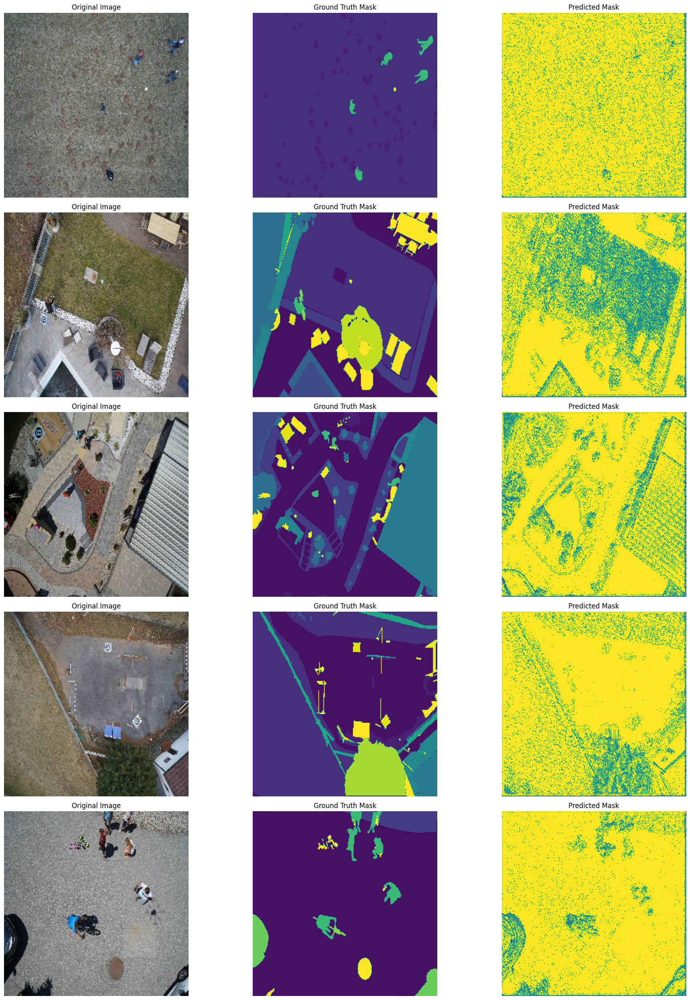

In [31]:
import matplotlib.pyplot as plt

def generate_predictions(model, dataset, num_samples):
    data_iter = iter(dataset)
    original_images, true_masks = next(data_iter)

    # Generate predictions
    pred_masks = model.predict(original_images)

    pred_masks = tf.argmax(pred_masks, axis=-1)
    pred_masks = pred_masks[..., tf.newaxis]  

    return original_images, true_masks, pred_masks

def plot_segmentation_results(original_images, true_masks, pred_masks, num_samples):
    plt.figure(figsize=(20, num_samples * 5))

    for i in range(num_samples):
        # Original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(original_images[i])
        plt.title("Original Image")
        plt.axis("off")

        # Ground truth mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(tf.squeeze(true_masks[i], axis=-1), cmap='viridis')
        plt.title("Ground Truth Mask")
        plt.axis("off")

        # Predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(tf.squeeze(pred_masks[i], axis=-1), cmap='viridis')
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

num_samples = 5  # Number of samples to visualize
original_images, true_masks, pred_masks = generate_predictions(unet_model, val_dataset, num_samples)
plot_segmentation_results(original_images, true_masks, pred_masks, num_samples)


3/3 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.3476 - loss: 3.0945
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


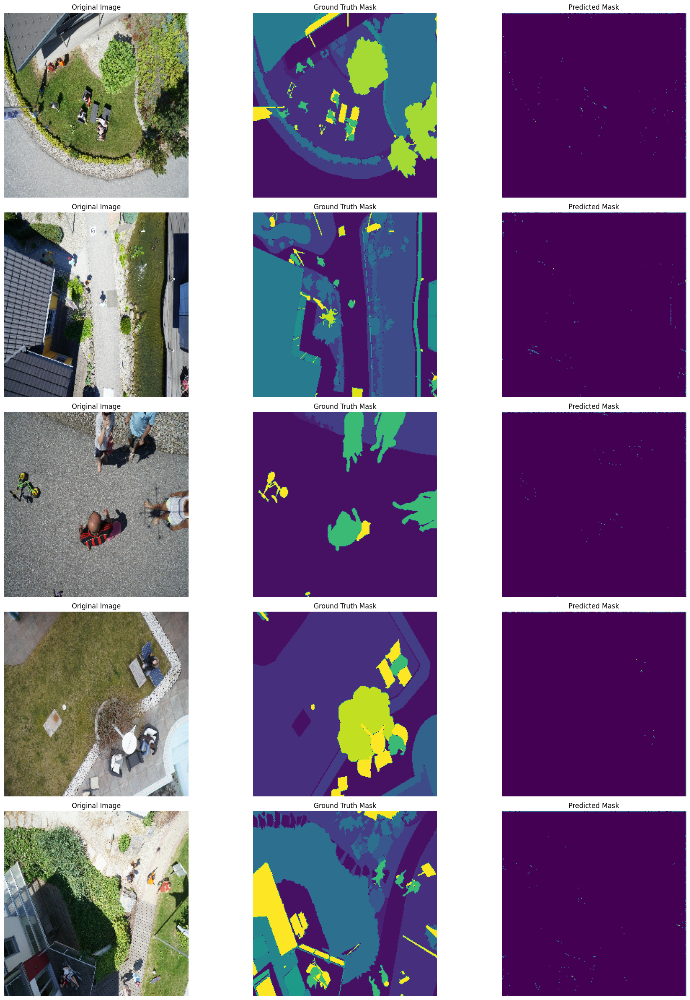

In [32]:
# Load the best model
best_model = tf.keras.models.load_model('best_model.keras', compile=False)
best_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                   loss='sparse_categorical_crossentropy', 
                   metrics=['accuracy'])

# Evaluate the best model
sengmentation_output = best_model.evaluate(val_dataset)

# Generate predictions and plot results
original_images, true_masks, pred_masks = generate_predictions(best_model, val_dataset, num_samples)
plot_segmentation_results(original_images, true_masks, pred_masks, num_samples)


# Post Processing and Classification

In [33]:
import numpy as np
from skimage import measure

class_labels = {
    0: 'paved-area',
    1: 'dirt',
    2: 'grass',
    3: 'gravel',
    4: 'water',
    5: 'rocks',
    6: 'pool',
    7: 'vegetation',
    8: 'roof',
    9: 'wall',
    10: 'window',
    11: 'door',
    12: 'fence',
    13: 'fence-pole',
    14: 'person',
    15: 'dog',
    16: 'car',
    17: 'bicycle',
    18: 'tree',
    19: 'bald-tree',
    20: 'ar-marker',
    21: 'obstacle',
    22: 'conflicting'
}

def classify_segments(segmentation_output):
    classification_result = []
    
    for i in range(segmentation_output.shape[0]):
        segmented_image = segmentation_output[i]
        
        # Initialize a dictionary to store classified regions
        classified_regions = {class_label: [] for class_label in class_labels.values()}
        
        # Process each class separately
        for class_index, class_name in class_labels.items():
            # Create a binary mask for the current class
            class_mask = (segmented_image == class_index).astype(np.uint8)
            
            # Label connected regions for the current class
            labeled_regions = measure.label(class_mask, connectivity=2)
            
            # Find properties of labeled regions
            region_props = measure.regionprops(labeled_regions)
            
            # Store the regions in the classification result
            for region in region_props:
                classified_regions[class_name].append(region)
        
        classification_result.append(classified_regions)
    
    return classification_result

#
segmentation_output = np.squeeze(pred_masks, axis=-1)  #
classification_result = classify_segments(segmentation_output)

# Print the classified regions for the first image in the batch
for class_name, regions in classification_result[0].items():
    print(f"Class: {class_name}, Number of Regions: {len(regions)}")



Class: paved-area, Number of Regions: 0
Class: dirt, Number of Regions: 1
Class: grass, Number of Regions: 0
Class: gravel, Number of Regions: 0
Class: water, Number of Regions: 8
Class: rocks, Number of Regions: 39
Class: pool, Number of Regions: 32
Class: vegetation, Number of Regions: 0
Class: roof, Number of Regions: 57
Class: wall, Number of Regions: 0
Class: window, Number of Regions: 0
Class: door, Number of Regions: 0
Class: fence, Number of Regions: 0
Class: fence-pole, Number of Regions: 18
Class: person, Number of Regions: 0
Class: dog, Number of Regions: 1
Class: car, Number of Regions: 0
Class: bicycle, Number of Regions: 0
Class: tree, Number of Regions: 0
Class: bald-tree, Number of Regions: 0
Class: ar-marker, Number of Regions: 0
Class: obstacle, Number of Regions: 0
Class: conflicting, Number of Regions: 0


**Landing Coordination Results**

Best landing spot coordinates: [255   0]


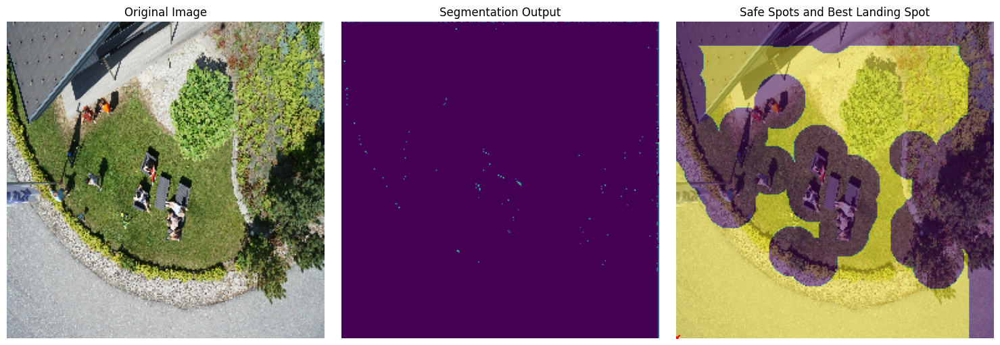

In [34]:
import numpy as np
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt

def safe_landing_criteria(segmentation_output, class_labels, distance_threshold=20):
    # Convert segmentation output to binary masks for dangerous areas
    dangerous_classes = ['water', 'rocks', 'pool', 'roof', 'wall', 'window', 'door', 'fence', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'obstacle']
    dangerous_indices = [index for index, name in class_labels.items() if name in dangerous_classes]

    safe_mask = np.ones(segmentation_output.shape[:2], dtype=np.uint8)

    for index in dangerous_indices:
        dangerous_mask = (segmentation_output == index).astype(np.uint8)
        safe_mask = np.logical_and(safe_mask, np.logical_not(dangerous_mask))

    # Distance transform to find the safest spots
    distance = distance_transform_edt(safe_mask)
    safe_spots = distance >= distance_threshold

    return safe_spots, distance

def choose_best_landing_spot(safe_spots, distance):
    if not np.any(safe_spots):
        raise ValueError("No safe spots identified. Please adjust the criteria or threshold.")

  
    max_distance = np.max(distance[safe_spots])
    best_spot = np.argwhere(distance == max_distance)[0]  # Get the coordinates of the best spot
    return best_spot

def plot_landing_spots(original_image, segmentation_output, safe_spots, best_spot):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(segmentation_output, cmap='viridis')
    plt.title("Segmentation Output")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(original_image)
    plt.imshow(safe_spots, cmap='viridis', alpha=0.5)
    plt.scatter([best_spot[1]], [best_spot[0]], color='red', marker='x')
    plt.title("Safe Spots and Best Landing Spot")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
segmentation_output = np.squeeze(pred_masks, axis=-1) 
safe_spots, distance = safe_landing_criteria(segmentation_output[0], class_labels, distance_threshold=20)
try:
    best_spot = choose_best_landing_spot(safe_spots, distance)
    print(f"Best landing spot coordinates: {best_spot}")
    plot_landing_spots(original_images[0], segmentation_output[0], safe_spots, best_spot)
except ValueError as e:
    print(e)
